# Legal Documentation Clustering 

In [1]:
import pandas as pd
import glob
import nltk
from string import punctuation
import time
import re
from collections import Counter
import random
import pickle
from sklearn.cluster import KMeans

In [3]:
# set the working directory where you wish to store the files and read or write results
%cd E:\USF - BAIS\DSP\corpus\corpus\fulltext 

E:\USF - BAIS\DSP\corpus\corpus\fulltext


In [4]:
#This is a Glob. Glob contains all the files and stores it.

files = [file for file in glob.glob("../fulltext/*")]

allfiles = []
for filename in files:
    filename = filename.split('\\')[1]
    allfiles.append(filename)

## Cleaning the Text

Here we are getting list of abbrivations commonly used in Australian business and day to day life (Since the documents are taken form Federal Court of Australia) so we can 'get rid of the abbrivations in the cleaned text.

In [5]:
import requests
import urllib.request
import time
from bs4 import BeautifulSoup

url = 'https://www.pmc.gov.au/who-we-are/accountability-and-reporting/acronyms-and-abbreviations'
response = requests.get(url)

soup = BeautifulSoup(response.text, 'html.parser')
soup.findAll('table')

all_table = soup.findAll('table')
count = 0
listAbb = []
for table in all_table:
    allTD = table.findAll('td')
    for i in range(0, len(allTD), 2):
        abbreviated = str(allTD[i])
        name = abbreviated.split(">")[1].strip().split(" ")[0].lower()
        name = name.replace("&amp;","&")
        listAbb.append(name)

In [6]:
#Function for cleaning the text

#regex expression to remove special charachters, digits, links and urls.

re_list = ['[\/(){}\[\]\|@,.;]','\d+\S*','http\S*','www\S+','".*?>','\_*','\"'] 

#re_list = ['[\/=<>(){},\'\[\]\|@,;]','\d+\S*','http\S*','www\S+','".*?>','\_*']##

generic_re = re.compile( '|'.join(re_list) )
cleaner = re.compile(generic_re)
STOPWORDS = nltk.corpus.stopwords.words('english')
STOPWORDS = STOPWORDS + listAbb
from textblob import TextBlob
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

def clean_text_suc(text):
    cleantext = text.lower().strip()
    cleantext = cleaner.sub('',cleantext)
    cleantext = ' '.join(word for word in cleantext.split() if word not in STOPWORDS and len(word) > 3) # delete stopwors from text
    words_pos = nltk.pos_tag([w for w in cleantext.split()])
    text1 = ''
    for word, pos in words_pos:
        if (pos in ['NN','NNS','JJ','VBG']):# extracting Noun forms , adjectives and verbs
            word_lemm = lemmatizer.lemmatize(word)
            word_lemm = word_lemm.strip('\'') #some additional pre-processing for some special words and formats
            text1 =  text1 +' '+ word_lemm
            text = text1.strip()
    return text

In [7]:
#Code to pick up a sample of documents from all the 3890 documents if you wish to pickup a sample from the available files

def list_sample(alist,number):
    sample_list = []
    for i in sorted(random.sample(range(len(alist)),number)):
        value = alist[i]
        sample_list.append(value)
    return sample_list

## Extracting text from XML files

### Extracting all the sentences tags from the XML file

In [8]:
import bs4 as bs 
import re
#!pip install progressbar

#If you wish to run the cleaning on sample uncomment this line and enter the number for the sample you need to take in place of 100

#files = list_sample(allfiles,100)

from progressbar import ProgressBar
pbar = ProgressBar()

start_time = time.time()

file_dict = {}
for filename in pbar(files): #To pickup each file from the source
    filename = filename.split('\\')[1] #comment out this line if you are using the sample
    infile = open(filename,"r")
    contents = infile.read()
    sent = ' '
    soup = bs.BeautifulSoup(contents,'xml')
    rawstr = ' '
    for url in soup.find_all('catchphrase'):#To pickup each catchphrase tag in the above picked file and perform cleaning operation
    #for url in soup.find_all('sentence'): #To pickup each sentence tag in the above picked file and perform cleaning operation
        sent = url.text.strip() #removes blanks or punctuations at the end or start of the string
        sent = clean_text_suc(sent) #cleaning as defined in the fucntion
        rawstr = rawstr + ' ' + str(sent.strip('')) #joining the cleaned sentence again to create the cleaned document 
        rawstr = rawstr.lower().strip('')
    file_dict[filename] = rawstr #storing the clean document across the file name as key!

print('Elapsed clock time: ', (time.time() - start_time)/60, ' minutes')

Elapsed clock time:  1.7290481209754944  minutes


{'06_1.xml': '  application appeal authorisation multiple infringement prior sale realty respondent primary proceeding payment substantial part proceeds sale company repayment loan absence material establishing original making purpose loan mareva ancillary order primary judge affidavit disclosing asset order requiring filing affidavit disclosure cross-examination respondent primary proceeding disclosure affidavit error making ancillary order leave practice procedure',
 '06_100.xml': '  point principle administrative human right',
 '06_1001.xml': '  discovery inclusion document annexure affidavit proper discovery document discovery necessary document party various document criterion federal court rule meaning possession custody power document possession custody control company administration corporation meaning general discovery federal court rule order general discovery document discoverable pursuant inquiry test practice procedure',
 '06_1004.xml': "  variation termination interpretat

In [161]:
'''
#Sentence
import pickle

with open('file_dict_sentences.pickle', 'wb') as handle:
    pickle.dump(file_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
'''

### Extracting all the Cathcphrases tags from the XML file

In [9]:
#CatchPhrases
import pickle

with open('file_dict_catchphrase.pickle', 'wb') as handle:
    pickle.dump(file_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [68]:
#CatchPhrases
import pickle

with open('file_dict_catchphrase.pickle', 'wb') as handle:
    pickle.dump(file_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [10]:
#extracting the values in the dictionary into a list

text_list = list(file_dict.values())
len(text_list)

3890

## Exploratory Data Analysis - Sentences

we computed a frequency of words and plotted top 30 most used words in the text corpus on a sample of 10 documents at random.

In [32]:
with open(r'E:\USF - BAIS\DSP\corpus\corpus\file_dict_sentences.pickle', 'rb') as pkl_file:
    file_dict = pickle.load(pkl_file) 

In [33]:
text_list = list(file_dict.values())

In [35]:
#This can be added as Exploratory Data Analysis
#Due to high volume of tokens (about 45 lac, it took almost 13 hours to run! Suitable with a sample file)
#top words:
word_list = []

text_list_sample = list_sample(text_list,10)

for record in text_list_sample:
    record_list = record.split(' ')
    for word in (record_list):
        if (word != ''):
            word_list.append(word)
print('1')
for word in word_list:
    #print(word)
    count = Counter(word_list).most_common()
count

1


[('tribunal', 162),
 ('claim', 156),
 ('order', 150),
 ('application', 149),
 ('proceeding', 147),
 ('court', 128),
 ('group', 126),
 ('interest', 109),
 ('appellant', 108),
 ('person', 103),
 ('cost', 102),
 ('respondent', 101),
 ('second', 88),
 ('party', 88),
 ('reason', 87),
 ('applicant', 87),
 ('member', 73),
 ('submission', 71),
 ('area', 69),
 ('determination', 69),
 ('system', 68),
 ('case', 65),
 ('native', 64),
 ('title', 64),
 ('hearing', 63),
 ('brother', 63),
 ('issue', 58),
 ('evidence', 58),
 ('question', 55),
 ('first', 53),
 ('poster', 53),
 ('relation', 52),
 ('representative', 52),
 ('rule', 51),
 ('stacey', 49),
 ('decision', 47),
 ('right', 46),
 ('fiji', 45),
 ('time', 45),
 ('protection', 43),
 ('federal', 43),
 ('part', 43),
 ('fact', 42),
 ('matter', 42),
 ('family', 41),
 ('ground', 40),
 ('people', 40),
 ('solicitor', 39),
 ('fijian', 38),
 ('filtration', 38),
 ('swimart', 37),
 ('pool', 37),
 ('counsel', 36),
 ('sister', 35),
 ('march', 35),
 ("appellant's"

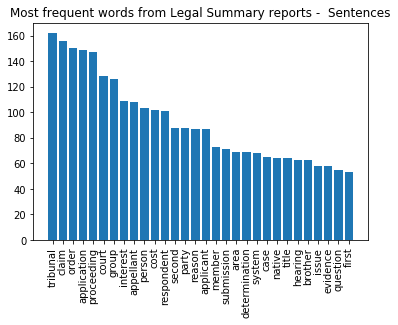

In [36]:
word,freq = zip(*count[0:30])

import matplotlib.pyplot as plt

plt.bar(word,freq)
plt.xticks(rotation=90)
plt.title('Most frequent words from Legal Summary reports -  Sentences')
plt.show()

## Exploratory Data Analysis - Catchphrases

In [37]:
with open(r'E:\USF - BAIS\DSP\corpus\corpus\file_dict_catchphrase.pickle', 'rb') as pkl_file:
    file_dict = pickle.load(pkl_file) 

In [38]:
text_list = list(file_dict.values())

In [40]:
#This can be added as Exploratory Data Analysis
#Due to high volume of tokens (about 45 lac, it took almost 8 hours to run! Suitable with a sample file)
#top words:
word_list = []

text_list_sample = list_sample(text_list,100)

for record in text_list_sample:
    record_list = record.split(' ')
    for word in (record_list):
        if (word != ''):
            word_list.append(word)
print('1')
for word in word_list:
    #print(word)
    count = Counter(word_list).most_common()
count

1


[('application', 71),
 ('appeal', 49),
 ('tribunal', 49),
 ('migration', 45),
 ('federal', 37),
 ('court', 34),
 ('order', 33),
 ('practice', 31),
 ('applicant', 30),
 ('consideration', 29),
 ('proceeding', 27),
 ('decision', 27),
 ('cost', 26),
 ('procedure', 22),
 ('magistrate', 22),
 ('review', 22),
 ('evidence', 20),
 ('rule', 19),
 ('claim', 18),
 ('company', 17),
 ('corporation', 17),
 ('conduct', 17),
 ('error', 15),
 ('hearing', 15),
 ('interlocutory', 15),
 ('administrative', 15),
 ('reasonable', 14),
 ('question', 14),
 ('contract', 14),
 ('party', 14),
 ('principle', 13),
 ('trade', 13),
 ('fact', 13),
 ('statement', 13),
 ('legal', 13),
 ('notice', 12),
 ('discretion', 12),
 ('appellant', 12),
 ('injunction', 12),
 ('service', 12),
 ('respondent', 11),
 ('document', 11),
 ('visa', 10),
 ('ground', 10),
 ('relation', 10),
 ('purpose', 10),
 ('breach', 9),
 ('dismissal', 9),
 ('penalty', 9),
 ('judicial', 9),
 ('finding', 9),
 ('process', 9),
 ('agreement', 9),
 ('refugee', 9

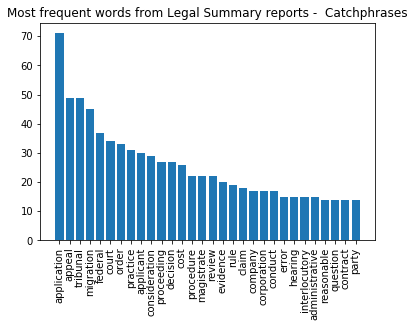

In [41]:
word,freq = zip(*count[0:30])

import matplotlib.pyplot as plt

plt.bar(word,freq)
plt.xticks(rotation=90)
plt.title('Most frequent words from Legal Summary reports -  Catchphrases')
plt.show()

## Loading text data from pickled object

In [42]:
with open(r'E:\USF - BAIS\DSP\corpus\corpus\file_dict_sentences.pickle', 'rb') as pkl_file:
    file_dict = pickle.load(pkl_file) 

In [53]:
with open(r'E:\USF - BAIS\DSP\corpus\corpus\file_dict_catchphrase.pickle', 'rb') as pkl_file:
    file_dict_catchphrase = pickle.load(pkl_file) 

In [43]:
text_list = list(file_dict.values())

In [54]:
text_list_catchphrase = list(file_dict_catchphrase.values())

## Cluster Analysis - Sentences

#### TFIDF Vectorizer

In [44]:
#Converting Text features into numerical values so they can be feb to machine learning algorithms for analysis.
#CatchPhrase

from sklearn.feature_extraction.text import TfidfVectorizer

vec_topicwords = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,1))
tfidf_topicwords = vec_topicwords.fit_transform(text_list)
tfidf_topicwords.shape

(3890, 64053)

#### Elbow method to detemine the number of clusters (K)

In [45]:
#Clean
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

N = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in N]
kmeans
score = [kmeans[i].fit(tfidf_topicwords).score(tfidf_topicwords) for i in range(len(kmeans))]
score

plt.plot(N, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

KeyboardInterrupt: 

#### K-Means with TFIDF

12    1115
3      486
6      302
0      264
9      230
4      218
17     162
8      150
1      130
11     126
14     122
16     115
2      110
5      108
15      82
10      82
13      78
7       10
Name: cluster, dtype: int64
Cluster 0:
claim,	motion,	trial,	statement,	second,	security,	pleading,	notice,	cross,	respondents,	

Cluster 1:
scheme,	share,	shareholder,	meeting,	company,	plaintiff,	member,	asic,	security,	director,	

Cluster 2:
mark,	extradition,	trade,	offence,	warrant,	good,	person,	custom,	summons,	criminal,	

Cluster 3:
appellant,	tribunal,	magistrate,	minister,	appeal,	federal,	persecution,	information,	immigration,	review,	

Cluster 4:
appeal,	magistrate,	federal,	appellant,	tribunal,	minister,	extension,	notice,	rule,	immigration,	

Cluster 5:
native,	title,	area,	land,	group,	claim,	determination,	traditional,	people,	right,	

Cluster 6:
tribunal,	minister,	visa,	appeal,	person,	injury,	appellant,	veteran,	child,	pension,	

Cluster 7:
allphones,	franchisees,	franchis

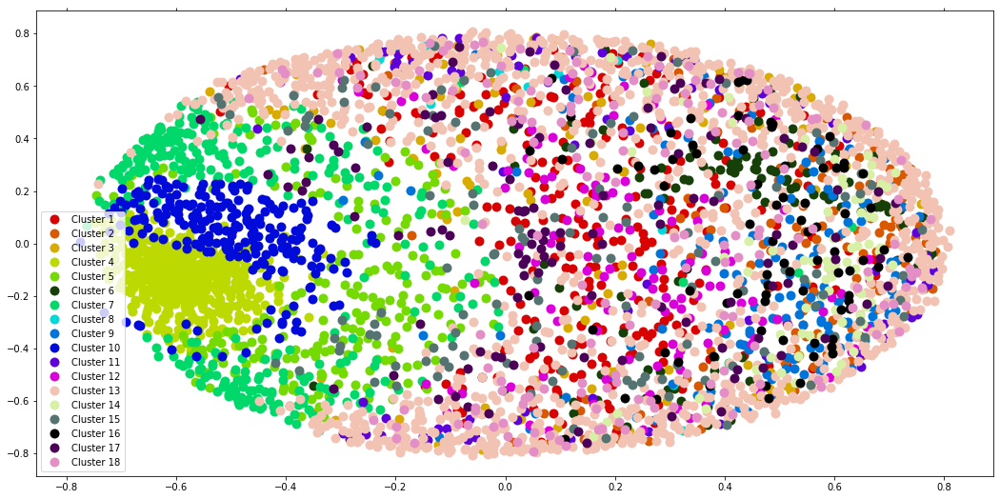

In [47]:
df = pd.DataFrame()
from sklearn.cluster import KMeans
num_clusters = 18
km = KMeans(n_clusters=num_clusters)
km.fit(tfidf_topicwords)
labels = km.labels_
clusters = labels.tolist()
len(clusters)                                      # 200
df['cluster'] = clusters
print(df['cluster'].value_counts())


#Here we plot the centoids of the clusters formed above and map it with the words which corresponds to the value of the centroids.

order_centroids = km.cluster_centers_.argsort()[:, ::-1] # arrangeing the cluster centers in ascending orders
terms = vec_topicwords.get_feature_names() #gettin the list of word from TFIDF 

for i in range(num_clusters):
    print('Cluster %d:' % i, end='\n')
    for ind in order_centroids[i, :10]:
        print('%s,' % terms[ind],end='\t')
    print('\n')
        
# Convert into two components using MDS to plot on a 2D plane

#generating X and Y comopnent for the every word by computing distance of that word from cluster center
from sklearn.metrics.pairwise import cosine_similarity
distance = 1 - cosine_similarity(tfidf_topicwords)  
distance

from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=42)
pos = mds.fit_transform(distance)
pos
xs, ys = pos[:, 0], pos[:, 1]

# Set up cluster names using a dict
cluster_names = {0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3', 3: 'Cluster 4', 4: 'Cluster 5', 5: 'Cluster 6',
                 6: 'Cluster 7', 7: 'Cluster 8', 8: 'Cluster 9', 9: 'Cluster 10', 10: 'Cluster 11', 11: 'Cluster 12',
                 12: 'Cluster 13', 13: 'Cluster 14', 14: 'Cluster 15', 15: 'Cluster 16', 16: 'Cluster 17', 17: 'Cluster 18'}
cluster_colors = {0: '#d90202', 1: '#d95802', 2: '#d9aa02', 3: '#bcd902', 4: '#75d902', 5: '#164007',
                  6: '#00d969', 7: '#00d9d9', 8: '#0074d9', 9: '#000bd9', 10: '#5e00d9', 11: '#d900d9',
                  12: '#f2c2b3', 13: '#d7f0a5', 14: '#557370', 15: '#000000', 16: '#4a0157', 17: '#e38fc6'}


# Plot clusters #unigrams
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters)) 
groups = df.groupby('label')
fig, ax = plt.subplots(figsize=(18, 9))

for name, group in groups:
    ax.plot(group.x, group.y, marker='.', linestyle='', ms=20,
            label=cluster_names[name], color=cluster_colors[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis= 'x',  which='both', bottom='off', top='off', labelbottom='off')
    ax.tick_params(axis= 'y', which='both', left='off', top='off', labelleft='off')
    
ax.legend(numpoints=1) 
plt.show()


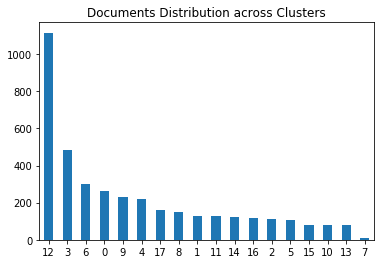

In [52]:
df['label'].value_counts().plot(kind = 'bar', rot = 0, title = 'Documents Distribution across Clusters')

#### Cleaning the sentence-text corpus further

Removing not so important words from the corpus. This is an iterative cleaning process as we cannot feed into the actual legal terms which can be used as tokens directly

In [55]:
replace = ['aus\S+','jud\S+','para\S+'] #replacing words like australia, australian/judge,judgment/paragraph,paralegal etc
cleanregex = re.compile('|'.join(replace))
remove_re = re.compile(cleanregex)
months = []
import calendar
for month in calendar.month_name[1:]:
    months.append(month.lower())
removed = ['case','date','court','hearing','counsel','application','copy','time','matter','appellant','appeal','trial',
          'review','tribunal','notice','fact','law','year','state','term','section','provision','considertaion','good',
          'invention','conduct','plaintiff','url','title','group','rule','word','term','person','solicitor','honor',
          'decision','party','reason','purpose','reference','issue','right','proceeding']+ months

#this is a list of words eye-balled and collated together which does not carry any specific meaning and are quite oftenly used in
#legal context or in general english which carry no specific meaning for clustering documents 

from progressbar import ProgressBar
pbar = ProgressBar()

clean_text_list =[]
cleantext=''
for text in pbar(text_list):
    cleantext = remove_re.sub('',text)
    cleantext = ' '.join(word for word in cleantext.split() if word not in removed)
    clean_text_list.append(cleantext)

clean_text_list

100% |########################################################################|


["background current applicant sharman network networks sharman license holding license nicola hemming hemming subject asset preservation order mareva orders referring applicant sharman applicants sharman applicant respondent infringement copyright present respondent music companies respect operation system primary proceedings wilcox order ancillary mareva order requiring sharman applicant affidavit description value asset asset applicant trust entity wilcox complex liability arising primary universal music sharman license holding hemming disclosure pursuant wilcox order whilst sharman license sharman sought several stay various ground order universal music sharman license holding universal music sharman license holding sharman license holding universal music disclosure behalf sharman license sharman network affidavit sharman license sharman network sought enlargement file wilcox order sharman license holding universal music lindgren music company amended motion seeking order ancillary

#### TFIDF Vectorizer with cleaner Sentence - text corpus

In [59]:
#Converting Text features into numerical values so they can be feb to machine learning algorithms for analysis.
#Sentences

from sklearn.feature_extraction.text import TfidfVectorizer

vec_topicwords = TfidfVectorizer(stop_words='english', max_df=0.6, ngram_range=(1,1))
tfidf_topicwords = vec_topicwords.fit_transform(clean_text_list) #the input here is changed from text_list to clean_text_list
tfidf_topicwords.shape

(3890, 63715)

0     811
11    350
5     349
17    275
3     265
6     230
4     217
16    213
1     154
8     144
2     141
13    136
7     127
10    124
9     113
12    103
14     76
15     62
Name: cluster_clean, dtype: int64
Cluster 0:
income,	evidence,	applicant,	taxation,	contract,	respondent,	assessment,	extradition,	agreement,	consideration,	

Cluster 1:
penalty,	industrial,	relation,	workplace,	agreement,	employee,	contravention,	union,	breach,	employment,	

Cluster 2:
discovery,	privilege,	document,	legal,	professional,	procedure,	practice,	preliminary,	advice,	applicant,	

Cluster 3:
cost,	order,	security,	indemnity,	applicant,	respondent,	offer,	basis,	procedure,	successful,	

Cluster 4:
administrative,	compensation,	applicant,	question,	entitlement,	veteran,	consideration,	veterans,	social,	pension,	

Cluster 5:
procedure,	practice,	order,	federal,	motion,	interlocutory,	summary,	consideration,	applicant,	stay,	

Cluster 6:
trade,	mark,	practice,	misleading,	representation,	deceptive,	co

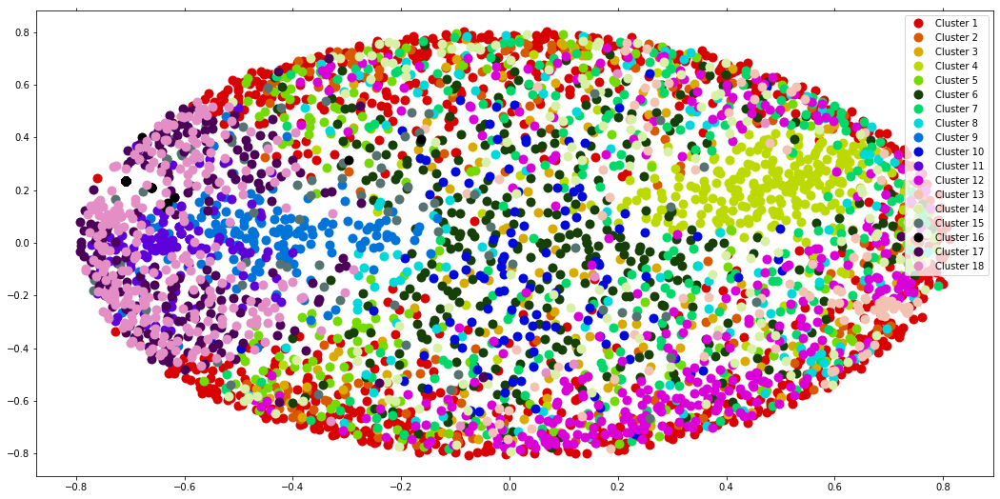

In [70]:
#df = pd.DataFrame()
from sklearn.cluster import KMeans
num_clusters = 18
km = KMeans(n_clusters=num_clusters)
km.fit(tfidf_topicwords)
labels = km.labels_
clusters = labels.tolist()
len(clusters)                                   
df['cluster_clean'] = clusters
print(df['cluster_clean'].value_counts())


#Here we plot the centoids of the clusters formed above and map it with the words which corresponds to the value of the centroids.

order_centroids = km.cluster_centers_.argsort()[:, ::-1] # arrangeing the cluster centers in ascending orders
terms = vec_topicwords.get_feature_names() #gettin the list of word from TFIDF 

for i in range(num_clusters):
    print('Cluster %d:' % i, end='\n')
    for ind in order_centroids[i, :10]:
        print('%s,' % terms[ind],end='\t')
    print('\n')
        
# Convert into two components using MDS to plot on a 2D plane

#generating X and Y comopnent for the every word by computing distance of that word from cluster center
from sklearn.metrics.pairwise import cosine_similarity
distance = 1 - cosine_similarity(tfidf_topicwords)  
distance

from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=42)
pos = mds.fit_transform(distance)
pos
xs, ys = pos[:, 0], pos[:, 1]

# Set up cluster names using a dict
cluster_names = {0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3', 3: 'Cluster 4', 4: 'Cluster 5', 5: 'Cluster 6',
                 6: 'Cluster 7', 7: 'Cluster 8', 8: 'Cluster 9', 9: 'Cluster 10', 10: 'Cluster 11', 11: 'Cluster 12',
                 12: 'Cluster 13', 13: 'Cluster 14', 14: 'Cluster 15', 15: 'Cluster 16', 16: 'Cluster 17', 17: 'Cluster 18'}
cluster_colors = {0: '#d90202', 1: '#d95802', 2: '#d9aa02', 3: '#bcd902', 4: '#75d902', 5: '#164007',
                  6: '#00d969', 7: '#00d9d9', 8: '#0074d9', 9: '#000bd9', 10: '#5e00d9', 11: '#d900d9',
                  12: '#f2c2b3', 13: '#d7f0a5', 14: '#557370', 15: '#000000', 16: '#4a0157', 17: '#e38fc6'}


# Plot clusters #unigrams
df_clean = pd.DataFrame(dict(x=xs, y=ys, label=clusters)) 
groups = df_clean.groupby('label')
fig, ax = plt.subplots(figsize=(18, 9))

for name, group in groups:
    ax.plot(group.x, group.y, marker='.', linestyle='', ms=20,
            label=cluster_names[name], color=cluster_colors[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis= 'x',  which='both', bottom='off', top='off', labelbottom='off')
    ax.tick_params(axis= 'y', which='both', left='off', top='off', labelleft='off')
    
ax.legend(numpoints=1) 
plt.show()


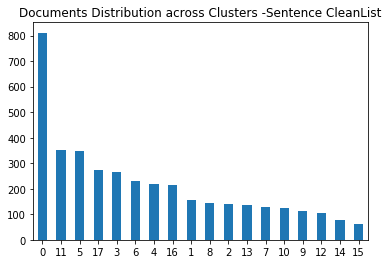

In [72]:
df['cluster_clean'].value_counts().plot(kind= 'bar', rot = 0, title = 'Documents Distribution across Clusters -Sentence CleanList')

## Cluster Analysis - Catchphrases

In [62]:
#CatchPhrases

from sklearn.feature_extraction.text import TfidfVectorizer

vec_topicwords = TfidfVectorizer(stop_words='english', max_df=0.6, ngram_range=(1,1))
tfidf_topicwords = vec_topicwords.fit_transform(text_list_catchphrase)
tfidf_topicwords.shape

(3890, 5880)

3     712
7     382
12    278
16    274
4     268
10    267
6     255
0     241
8     227
2     175
14    167
1     131
11    130
9     102
13     84
17     81
15     61
5      55
Name: cluster_catchphrase, dtype: int64
Cluster 0:
trade,	practice,	mark,	misleading,	representation,	deceptive,	contract,	damage,	contravention,	respondent,	

Cluster 1:
patent,	evidence,	witness,	expert,	infringement,	cross,	consideration,	discretion,	claim,	respondent,	

Cluster 2:
magistrate,	federal,	migration,	error,	refugee,	ground,	consideration,	interlocutory,	jurisdictional,	dismissing,	

Cluster 3:
income,	contract,	taxation,	corporation,	order,	injunction,	assessment,	agreement,	power,	duty,	

Cluster 4:
applicant,	respondent,	discrimination,	extradition,	minister,	claim,	federal,	order,	migration,	procedure,	

Cluster 5:
point,	principle,	migration,	magistrate,	federal,	immigration,	human,	protection,	security,	visa,	

Cluster 6:
corporation,	company,	liquidator,	winding,	creditor,	insolvency,	or

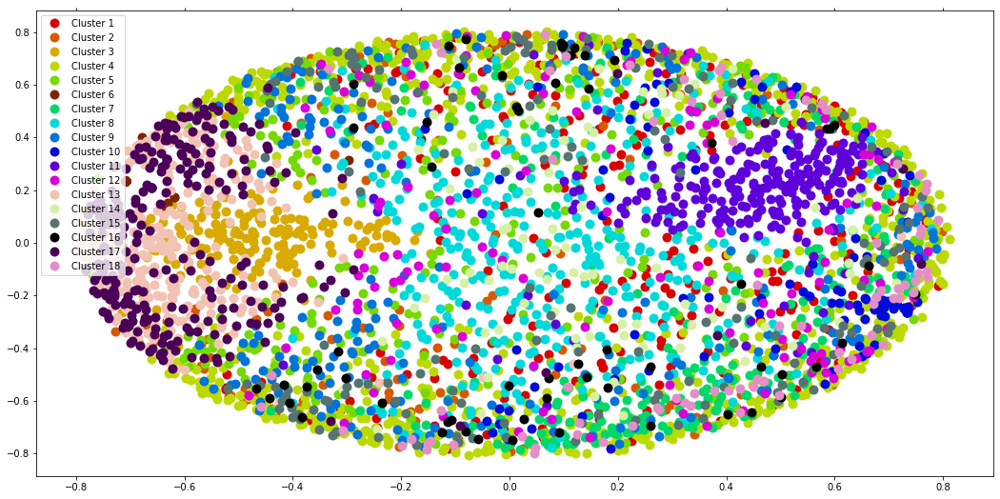

In [73]:
#CatchPhrases

#df = pd.DataFrame()
from sklearn.cluster import KMeans
num_clusters = 18
km = KMeans(n_clusters=num_clusters)
km.fit(tfidf_topicwords)
labels = km.labels_
clusters = labels.tolist()
len(clusters)                                     
df['cluster_catchphrase'] = clusters
print(df['cluster_catchphrase'].value_counts())


#Here we plot the centoids of the clusters formed above and map it with the words which corresponds to the value of the centroids.
order_centroids = km.cluster_centers_.argsort()[:, ::-1] # arrangeing the cluster centers in ascending orders
terms = vec_topicwords.get_feature_names() #gettin the list of word from TFIDF 

for i in range(num_clusters):
    print('Cluster %d:' % i, end='\n')
    for ind in order_centroids[i, :10]:
        print('%s,' % terms[ind],end='\t')
    print('\n')
        
# Convert into two components using MDS to plot on a 2D plane

#generating X and Y comopnent for the every word by computing distance of that word from cluster center
from sklearn.metrics.pairwise import cosine_similarity
distance = 1 - cosine_similarity(tfidf_topicwords)  
distance

from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=42)
pos = mds.fit_transform(distance)
pos
xs, ys = pos[:, 0], pos[:, 1]

# Set up cluster names using a dict
cluster_names = {0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3', 3: 'Cluster 4', 4: 'Cluster 5', 5: 'Cluster 6',
                 6: 'Cluster 7', 7: 'Cluster 8', 8: 'Cluster 9', 9: 'Cluster 10', 10: 'Cluster 11', 11: 'Cluster 12',
                 12: 'Cluster 13', 13: 'Cluster 14', 14: 'Cluster 15', 15: 'Cluster 16', 16: 'Cluster 17', 17: 'Cluster 18'}
cluster_colors = {0: '#d90202', 1: '#d95802', 2: '#d9aa02', 3: '#bcd902', 4: '#75d902', 5: '#7d2502',
                  6: '#00d969', 7: '#00d9d9', 8: '#0074d9', 9: '#000bd9', 10: '#5e00d9', 11: '#d900d9',
                  12: '#f2c2b3', 13: '#d7f0a5', 14: '#557370', 15: '#000000', 16: '#4a0157', 17: '#e38fc6'}


# Plot clusters #unigrams
df_catch = pd.DataFrame(dict(x=xs, y=ys, label=clusters)) 
groups = df_catch.groupby('label')
fig, ax = plt.subplots(figsize=(18, 9))

for name, group in groups:
    ax.plot(group.x, group.y, marker='.', linestyle='', ms=20,
            label=cluster_names[name], color=cluster_colors[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis= 'x',  which='both', bottom='off', top='off', labelbottom='off')
    ax.tick_params(axis= 'y', which='both', left='off', top='off', labelleft='off')
    
ax.legend(numpoints=1) 
plt.show()


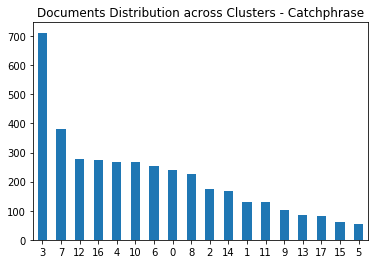

In [76]:
df['cluster_catchphrase'].value_counts().plot(kind = 'bar',rot = 0,title = 'Documents Distribution across Clusters - Catchphrase')

#### Cleaning the Catchphrase-text corpus further

In [65]:
replace = ['aus\S+','jud\S+','para\S+'] #replacing words like australia, australian/judge,judgment/paragraph,paralegal etc
cleanregex = re.compile('|'.join(replace))
remove_re = re.compile(cleanregex)
months = []
import calendar
for month in calendar.month_name[1:]:
    months.append(month.lower())
removed = ['case','date','court','hearing','counsel','application','copy','time','matter','appellant','appeal','trial',
          'review','tribunal','notice','fact','law','year','state','term','section','provision','considertaion','good',
          'invention','conduct','plaintiff','url','title','group','rule','word','term','person','solicitor','honor',
          'decision','party','reason','purpose','reference','issue','right','proceeding']+ months

#this is a list of words eye-balled and collated together which does not carry any specific meaning and are quite oftenly used in
#legal context or in general english which carry no specific meaning for clustering documents 

from progressbar import ProgressBar
pbar = ProgressBar()

clean_text_list_catchphrase =[]
cleantext=''
for text in pbar(text_list_catchphrase):
    cleantext = remove_re.sub('',text)
    cleantext = ' '.join(word for word in cleantext.split() if word not in removed)
    clean_text_list_catchphrase.append(cleantext)

clean_text_list_catchphrase

100% |########################################################################|


['authorisation multiple infringement prior sale realty respondent primary payment substantial part proceeds sale company repayment loan absence material establishing original making loan mareva ancillary order primary affidavit disclosing asset order requiring filing affidavit disclosure cross-examination respondent primary disclosure affidavit error making ancillary order leave practice procedure',
 'point principle administrative human',
 'discovery inclusion document annexure affidavit proper discovery document discovery necessary document various document criterion federal meaning possession custody power document possession custody control company administration corporation meaning general discovery federal order general discovery document discoverable pursuant inquiry test practice procedure',
 "variation termination interpretation managing director company service contract private company annual payable company financial difficulty unilateral temporary reduction managing direct

In [67]:
#CatchPhrases

from sklearn.feature_extraction.text import TfidfVectorizer

vec_topicwords = TfidfVectorizer(stop_words='english', max_df=0.6, ngram_range=(1,1))
tfidf_topicwords = vec_topicwords.fit_transform(clean_text_list_catchphrase)
tfidf_topicwords.shape

(3890, 5817)

2     837
6     497
5     406
16    265
3     258
13    228
12    180
9     174
4     170
15    166
17    146
10    128
0     102
1      94
14     76
11     62
8      55
7      46
Name: cluster_clean_catchphrase, dtype: int64
Cluster 0:
native,	determination,	claim,	consent,	claimant,	applicant,	registration,	registrar,	order,	land,	

Cluster 1:
information,	migration,	visa,	refugee,	country,	applicant,	protection,	failure,	procedural,	particular,	

Cluster 2:
evidence,	respondent,	applicant,	income,	contract,	taxation,	order,	injunction,	assessment,	extradition,	

Cluster 3:
administrative,	compensation,	applicant,	question,	veteran,	entitlement,	consideration,	veterans,	pension,	error,	

Cluster 4:
company,	corporation,	creditor,	liquidator,	administration,	meeting,	director,	liquidation,	winding,	administrator,	

Cluster 5:
procedure,	practice,	order,	federal,	claim,	motion,	interlocutory,	statement,	pleading,	applicant,	

Cluster 6:
migration,	visa,	protection,	error,	refugee,	juri

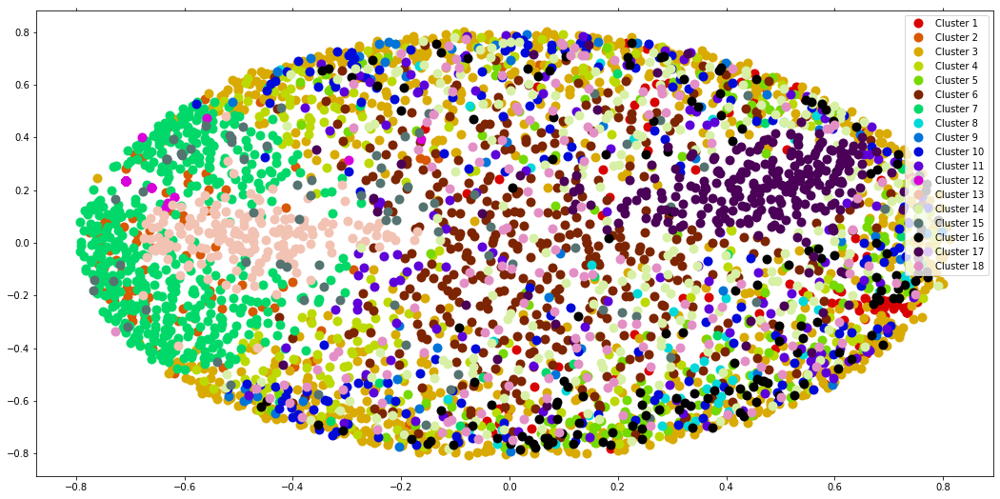

In [75]:
#CatchPhrases

#df = pd.DataFrame()
from sklearn.cluster import KMeans
num_clusters = 18
km = KMeans(n_clusters=num_clusters)
km.fit(tfidf_topicwords)
labels = km.labels_
clusters = labels.tolist()
len(clusters)                                     
df['cluster_clean_catchphrase'] = clusters
print(df['cluster_clean_catchphrase'].value_counts())


#Here we plot the centoids of the clusters formed above and map it with the words which corresponds to the value of the centroids.
order_centroids = km.cluster_centers_.argsort()[:, ::-1] # arrangeing the cluster centers in ascending orders
terms = vec_topicwords.get_feature_names() #gettin the list of word from TFIDF 

for i in range(num_clusters):
    print('Cluster %d:' % i, end='\n')
    for ind in order_centroids[i, :10]:
        print('%s,' % terms[ind],end='\t')
    print('\n')
        
# Convert into two components using MDS to plot on a 2D plane

#generating X and Y comopnent for the every word by computing distance of that word from cluster center
from sklearn.metrics.pairwise import cosine_similarity
distance = 1 - cosine_similarity(tfidf_topicwords)  
distance

from sklearn.manifold import MDS
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=42)
pos = mds.fit_transform(distance)
pos
xs, ys = pos[:, 0], pos[:, 1]

# Set up cluster names using a dict
cluster_names = {0: 'Cluster 1', 1: 'Cluster 2', 2: 'Cluster 3', 3: 'Cluster 4', 4: 'Cluster 5', 5: 'Cluster 6',
                 6: 'Cluster 7', 7: 'Cluster 8', 8: 'Cluster 9', 9: 'Cluster 10', 10: 'Cluster 11', 11: 'Cluster 12',
                 12: 'Cluster 13', 13: 'Cluster 14', 14: 'Cluster 15', 15: 'Cluster 16', 16: 'Cluster 17', 17: 'Cluster 18'}
cluster_colors = {0: '#d90202', 1: '#d95802', 2: '#d9aa02', 3: '#bcd902', 4: '#75d902', 5: '#7d2502',
                  6: '#00d969', 7: '#00d9d9', 8: '#0074d9', 9: '#000bd9', 10: '#5e00d9', 11: '#d900d9',
                  12: '#f2c2b3', 13: '#d7f0a5', 14: '#557370', 15: '#000000', 16: '#4a0157', 17: '#e38fc6'}


# Plot clusters #unigrams
df_catch_clean = pd.DataFrame(dict(x=xs, y=ys, label=clusters)) 
groups = df_catch_clean.groupby('label')
fig, ax = plt.subplots(figsize=(18, 9))

for name, group in groups:
    ax.plot(group.x, group.y, marker='.', linestyle='', ms=20,
            label=cluster_names[name], color=cluster_colors[name], mec='none')
    ax.set_aspect('auto')
    ax.tick_params(axis= 'x',  which='both', bottom='off', top='off', labelbottom='off')
    ax.tick_params(axis= 'y', which='both', left='off', top='off', labelleft='off')
    
ax.legend(numpoints=1) 
plt.show()


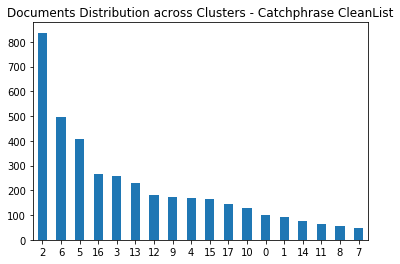

In [77]:
df['cluster_clean_catchphrase'].value_counts().plot(kind = 'bar', rot = 0, title = 'Documents Distribution across Clusters - Catchphrase CleanList')

# Word2Vec

In [122]:
def wordtoken(text):
    for w in text.split():
        wordlist.append(w)
    return wordlist

In [123]:
wordtokenlist = []

for text in text_list:
    wordlist = []
    words = wordtoken(text)
    #print(words)
    wordtokenlist.append(words)

wordtokenlist

[['application',
  'appeal',
  'authorisation',
  'multiple',
  'infringement',
  'prior',
  'sale',
  'realty',
  'respondent',
  'primary',
  'proceeding',
  'payment',
  'substantial',
  'part',
  'proceeds',
  'sale',
  'company',
  'repayment',
  'loan',
  'absence',
  'material',
  'establishing',
  'original',
  'making',
  'purpose',
  'loan',
  'mareva',
  'ancillary',
  'order',
  'primary',
  'judge',
  'affidavit',
  'disclosing',
  'asset',
  'order',
  'requiring',
  'filing',
  'affidavit',
  'disclosure',
  'cross-examination',
  'respondent',
  'primary',
  'proceeding',
  'disclosure',
  'affidavit',
  'error',
  'making',
  'ancillary',
  'order',
  'leave',
  'practice',
  'procedure'],
 ['point', 'principle', 'administrative', 'human', 'right'],
 ['discovery',
  'inclusion',
  'document',
  'annexure',
  'affidavit',
  'proper',
  'discovery',
  'document',
  'discovery',
  'necessary',
  'document',
  'party',
  'various',
  'document',
  'criterion',
  'federal',

In [125]:
from gensim.models import Word2Vec
num_features = 100
model = Word2Vec(wordtokenlist, size=num_features, window=8, min_count=2, 
    sample=1e-3, sg=1, iter=5, workers=8)
vocab = set(model.wv.index2word)
len(vocab)

4020

In [126]:
def average_word_vectors(words, model, vocabulary, num_features):
    feature_vector = np.zeros((num_features,), dtype="float64")
    nwords = 0.
    for word in words:
        if word in vocabulary: 
            nwords = nwords + 1
            feature_vector = np.add(feature_vector, model.wv[word])
    if nwords:
        feature_vector = np.divide(feature_vector, nwords)
    return feature_vector

In [127]:
import numpy as np
avg_features = np.array([average_word_vectors(w,model,vocab, num_features = 100) for w in wordtokenlist])

In [128]:
df_data = pd.DataFrame(list(file_dict.keys()),
                      columns=['key'])

In [129]:
num_clusters = 18
km = KMeans(n_clusters=num_clusters)
km.fit(avg_features)
kmeans_clusters_word2vec = np.array(km.labels_)
print(kmeans_clusters_word2vec)
df_data['KMeans_Word2Vec'] = kmeans_clusters_word2vec
print(df_data['KMeans_Word2Vec'].value_counts())


[ 6  5 15 ...  6  7 12]
8     429
6     336
5     293
12    293
4     283
14    274
11    267
9     236
3     212
17    207
0     203
13    189
7     175
15    139
2     119
10    109
16     69
1      57
Name: KMeans_Word2Vec, dtype: int64


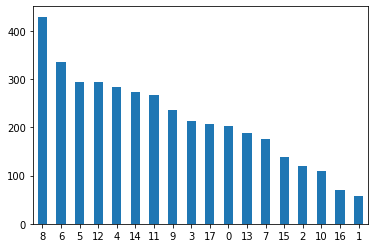

In [130]:
df_data['KMeans_Word2Vec'].value_counts().plot(kind = 'bar', rot=0)

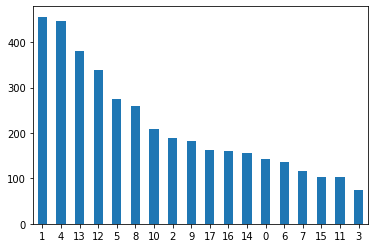

In [133]:
df['label'].value_counts().plot(kind = 'bar',rot = 0) #from k-means and TFIDF

In [106]:
df_data.to_csv("output.csv")

In [70]:
#validating the clusters using doc2bow similarity matrix

from gensim.corpora import Dictionary
dictionary = Dictionary(wordtokenlist)
print(dictionary)

Dictionary(7111 unique tokens: ['asset', 'australia', 'basis', 'clarity', 'consideration']...)


In [73]:
sent = {}
i = 0
for tokenlist in wordtokenlist:
    sent[i] = dictionary.doc2bow(tokenlist)
    i = i+1

In [89]:
import gensim.downloader as api
ft300 = api.load('fasttext-wiki-news-subwords-300')

In [90]:
from gensim.similarities import SoftCosineSimilarity
from gensim.matutils import softcossim
bow_corpus = [sent[i] for i in range(3890)]
similarity_matrix = ft300.similarity_matrix(dictionary, tfidf=None, threshold=0.0, 
    exponent=2.0, nonzero_limit=100)
docsim_index = SoftCosineSimilarity(bow_corpus, similarity_matrix, num_best=10)
new_doc = 'Some of the broad classes of circumstances in which the exercise of discretion to award indemnity costs may be appropriate'.split()  
d2b = dictionary.doc2bow(new_doc)
sims = docsim_index[d2b]

C:\Users\vijle\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `similarity_matrix` (Method will be removed in 4.0.0, use gensim.models.keyedvectors.WordEmbeddingSimilarityIndex instead).
  """
C:\Users\vijle\Anaconda3\lib\site-packages\gensim\similarities\termsim.py:358: RuntimeWarning: divide by zero encountered in true_divide
  Y = np.multiply(Y, 1 / np.sqrt(Y_norm))
C:\Users\vijle\Anaconda3\lib\site-packages\gensim\similarities\termsim.py:358: RuntimeWarning: invalid value encountered in multiply
  Y = np.multiply(Y, 1 / np.sqrt(Y_norm))


In [91]:
sims

[(2161, 0.8342847228050232),
 (1324, 0.8252449631690979),
 (3567, 0.7414059638977051),
 (2364, 0.7408975958824158),
 (1710, 0.7375950813293457),
 (3531, 0.7375950813293457),
 (3623, 0.7232621908187866),
 (545, 0.7218583226203918),
 (3458, 0.7218583226203918),
 (3846, 0.7218583226203918)]

In [110]:
list(file_dict.keys())[2364]

'08_1628.xml'

In [102]:
new_doc1 = 'patent infringement copyright breach intellectual property'.split()
d2b1 = dictionary.doc2bow(new_doc1)
sims = docsim_index[d2b1]

C:\Users\vijle\Anaconda3\lib\site-packages\gensim\similarities\termsim.py:358: RuntimeWarning: divide by zero encountered in true_divide
  Y = np.multiply(Y, 1 / np.sqrt(Y_norm))
C:\Users\vijle\Anaconda3\lib\site-packages\gensim\similarities\termsim.py:358: RuntimeWarning: invalid value encountered in multiply
  Y = np.multiply(Y, 1 / np.sqrt(Y_norm))


In [112]:
sims

[(2158, 0.8308603763580322),
 (1335, 0.7935409545898438),
 (1969, 0.7371225953102112),
 (1730, 0.7342710494995117),
 (1407, 0.7342710494995117),
 (625, 0.7342710494995117),
 (298, 0.7314168214797974),
 (2088, 0.7314168214797974),
 (3710, 0.7314168214797974),
 (3293, 0.7314168214797974)]

In [116]:
list(file_dict.keys())[1407]

'07_1615.xml'